### Demo - Optical Flow Generate Wind Flow from Satellite Frames
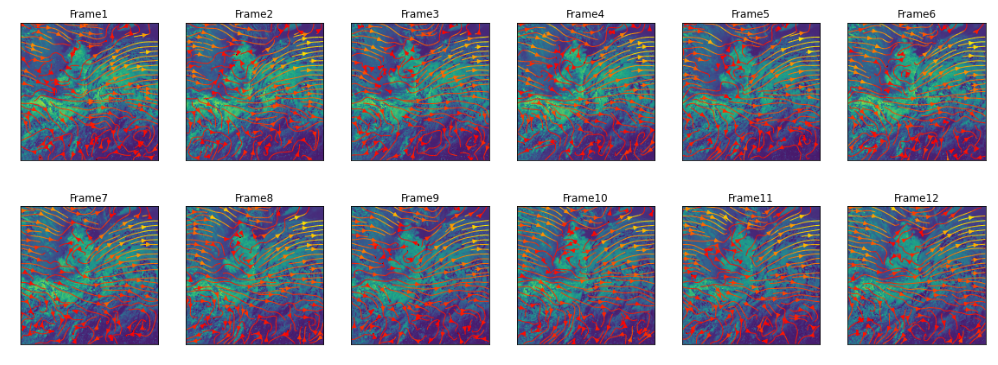
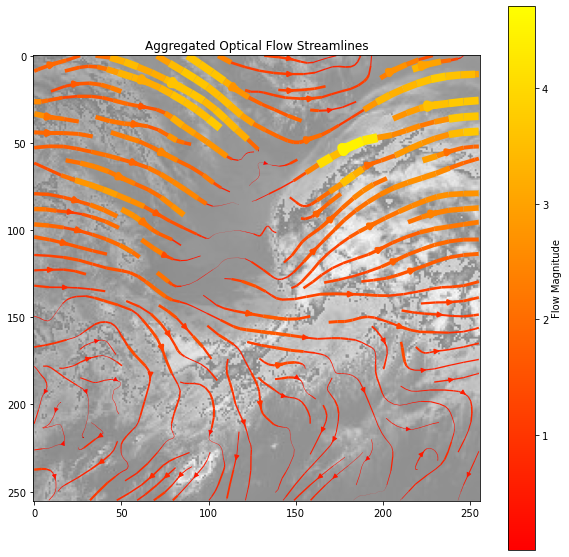

In [4]:
import glob
import shutil
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

### 1. Collect Image Frames

In [9]:
image_path = r'D:\Tommy\++AI\himawari9\jvtest\b13'
image_files = sorted(glob.glob(image_path+'\\'+'TBB_*_4_12_5.jpg'))
image_files

['D:\\Tommy\\++AI\\himawari9\\jvtest\\b13\\TBB_20240828000000_4_12_5.jpg',
 'D:\\Tommy\\++AI\\himawari9\\jvtest\\b13\\TBB_20240828001000_4_12_5.jpg',
 'D:\\Tommy\\++AI\\himawari9\\jvtest\\b13\\TBB_20240828002000_4_12_5.jpg',
 'D:\\Tommy\\++AI\\himawari9\\jvtest\\b13\\TBB_20240828003000_4_12_5.jpg',
 'D:\\Tommy\\++AI\\himawari9\\jvtest\\b13\\TBB_20240828004000_4_12_5.jpg',
 'D:\\Tommy\\++AI\\himawari9\\jvtest\\b13\\TBB_20240828005000_4_12_5.jpg',
 'D:\\Tommy\\++AI\\himawari9\\jvtest\\b13\\TBB_20240828010000_4_12_5.jpg',
 'D:\\Tommy\\++AI\\himawari9\\jvtest\\b13\\TBB_20240828011000_4_12_5.jpg',
 'D:\\Tommy\\++AI\\himawari9\\jvtest\\b13\\TBB_20240828012000_4_12_5.jpg',
 'D:\\Tommy\\++AI\\himawari9\\jvtest\\b13\\TBB_20240828013000_4_12_5.jpg',
 'D:\\Tommy\\++AI\\himawari9\\jvtest\\b13\\TBB_20240828014000_4_12_5.jpg',
 'D:\\Tommy\\++AI\\himawari9\\jvtest\\b13\\TBB_20240828015000_4_12_5.jpg',
 'D:\\Tommy\\++AI\\himawari9\\jvtest\\b13\\TBB_20240828020000_4_12_5.jpg',
 'D:\\Tommy\\++AI\\himawa

### 2. Find Directions

In [10]:
def draw_flow(img, flow, step=4):
    h, w = img.shape[:2]
    y, x = np.mgrid[step//2:h:step, step//2:w:step].reshape(2, -1)
    fx, fy = flow[y, x].T
    lines = np.vstack([x, y, x+fx, y+fy]).T.reshape(-1, 2, 2)
    lines = np.int32(lines)
    vis = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    for (x1, y1), (x2, y2) in lines:
        cv2.arrowedLine(vis, (x1, y1), (x2, y2), (0, 255, 0), 1, tipLength=0.5)
    return vis

In [11]:
# 选择前24帧图像
num_frames = 24
images = [cv2.imread(image_files[i], cv2.IMREAD_GRAYSCALE) for i in range(num_frames)]

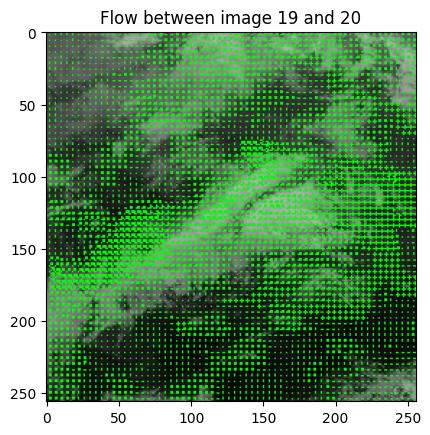

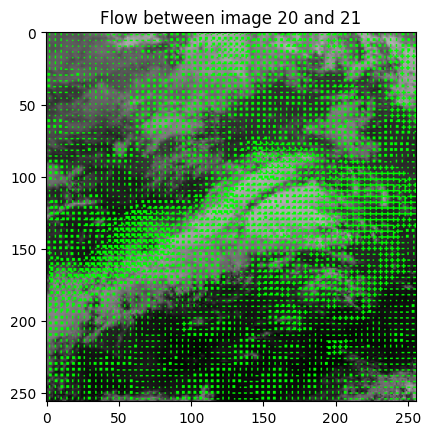

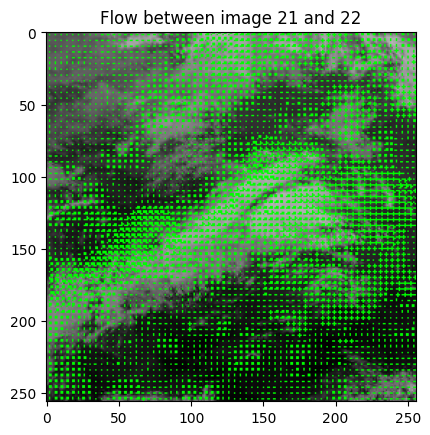

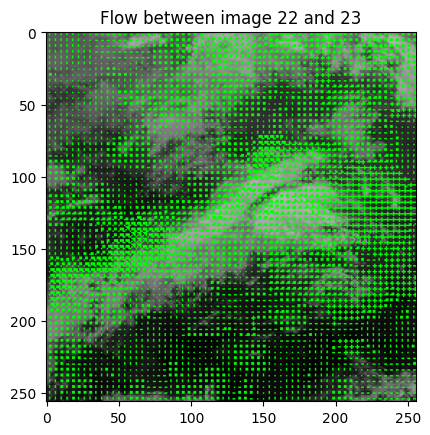

In [13]:
# 计算光流并绘制路径
for i in range(1, len(images)):
    prev_img = images[i-1]
    next_img = images[i]
    
    # 计算光流
    flow = cv2.calcOpticalFlowFarneback(prev_img, next_img, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    
    # 可视化光流
    flow_vis = draw_flow(next_img, flow)
    
    # 显示结果 (last 4 frames)
    if i>=20:
        plt.imshow(flow_vis)
        plt.title(f'Flow between image {i-1} and {i}')
    plt.show()

### 3. Draw Optical Tracks

In [14]:
def draw_flow(img, flow, step=16):
    h, w = img.shape[:2]
    y, x = np.mgrid[step//2:h:step, step//2:w:step].reshape(2, -1)
    fx, fy = flow[y, x].T
    lines = np.vstack([x, y, x+fx, y+fy]).T.reshape(-1, 2, 2)
    lines = np.int32(lines)
    vis = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    for (x1, y1), (x2, y2) in lines:
        cv2.arrowedLine(vis, (x1, y1), (x2, y2), (0, 255, 0), 2, tipLength=1.4)
    return vis

def draw_hsv(flow):
    h, w = flow.shape[:2]
    fx, fy = flow[:, :, 0], flow[:, :, 1]
    ang = np.arctan2(fy, fx) + np.pi
    v = np.sqrt(fx*fx + fy*fy)
    hsv = np.zeros((h, w, 3), dtype=np.uint8)
    hsv[..., 0] = ang * (180 / np.pi / 2)
    hsv[..., 1] = 255
    hsv[..., 2] = np.minimum(v * 4, 255)
    bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return bgr

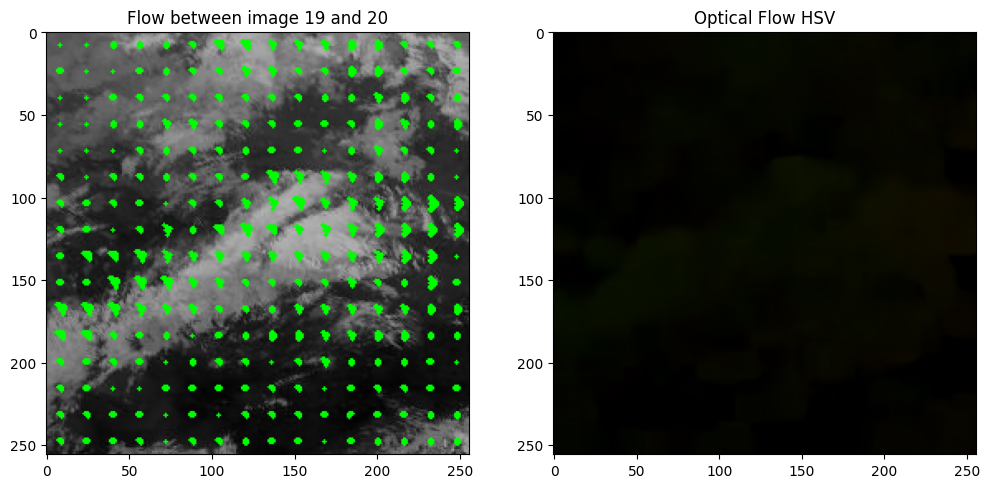

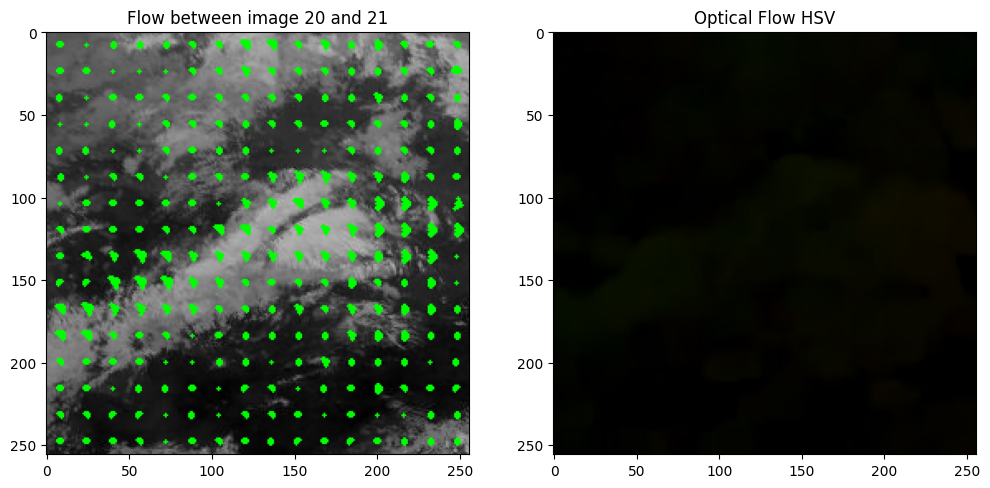

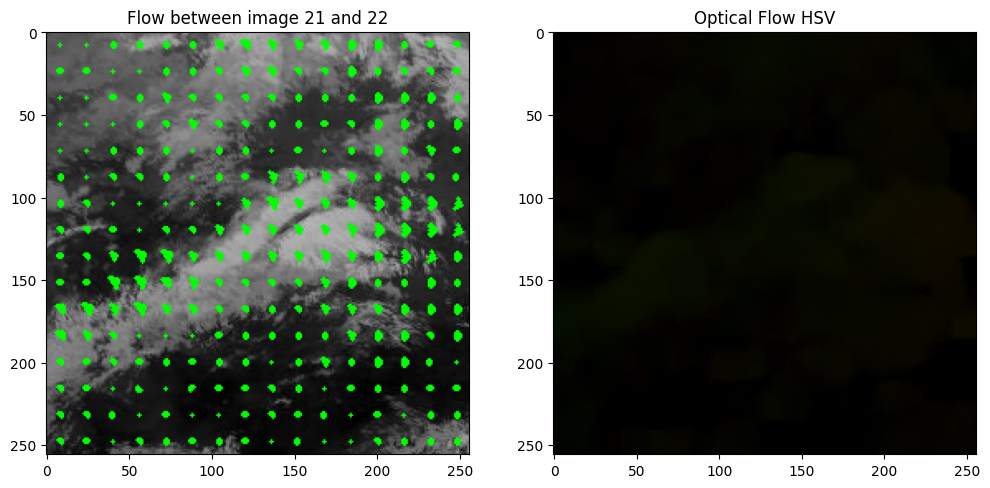

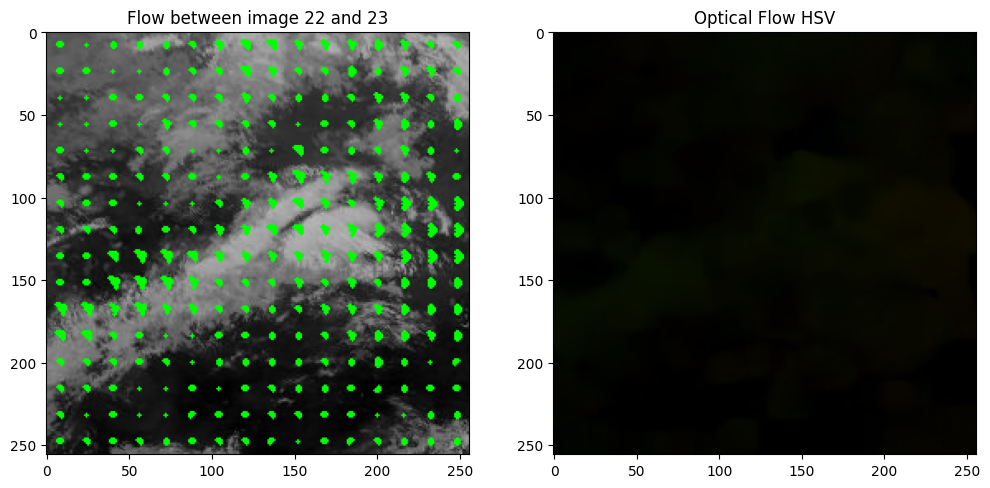

In [15]:
# 计算光流并绘制路径
for i in range(1, len(images)):
    prev_img = images[i-1]
    next_img = images[i]
    
    # 计算光流
    flow = cv2.calcOpticalFlowFarneback(prev_img, next_img, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    
    # 可视化光流
    flow_vis = draw_flow(next_img, flow)
    hsv_vis = draw_hsv(flow)
    
    if i>=20:
        # 显示结果
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(flow_vis)
        plt.title(f'Flow between image {i-1} and {i}')
        plt.subplot(1, 2, 2)
        plt.imshow(hsv_vis)
        plt.title(f'Optical Flow HSV')
        plt.show()

### 4. Draw Stream Lines

In [16]:
def compute_optical_flow(images):
    flows = []
    for i in range(1, len(images)):
        prev_img = images[i-1]
        next_img = images[i]
        flow = cv2.calcOpticalFlowFarneback(prev_img, next_img, None, 0.5, 3, 15, 3, 5, 1.2, 0)
        flows.append(flow)
    return flows

In [17]:
# total frams show up
num_frames = 24
# start frame
sf=41
images = [cv2.imread(image_files[i], cv2.IMREAD_GRAYSCALE) for i in range(sf, sf+num_frames)]

In [18]:
# 计算光流
flows = compute_optical_flow(images)



#### Flows
- flows holds 23 frames (flow will compare difference between two frames, this is why 24 frames will generate 23 flows)
- each frame generats u,v data
- last_flow holds the u,v data for last frame

In [19]:
len(flows)

23

In [20]:
flows[0].shape

(256, 256, 2)

#### Draw optical stream in last frame

In [21]:
# 选择最后一个光流结果用于绘制流线图
last_flow = flows[-1]

# 获取光流的 x 和 y 分量
flow_x = last_flow[..., 0]
flow_y = last_flow[..., 1]

# 生成网格点
h, w = flow_x.shape
y, x = np.mgrid[0:h, 0:w]

In [22]:
h,w

(256, 256)

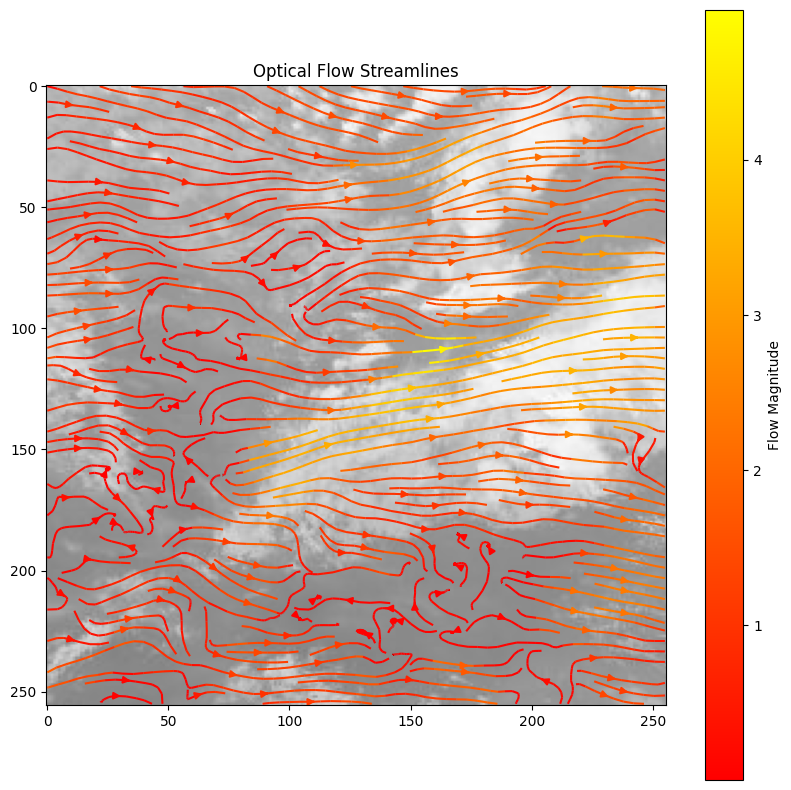

In [23]:
# 绘制流线图
plt.figure(figsize=(10, 10))
plt.imshow(images[-1], cmap='gray', alpha=0.5)
plt.streamplot(x, y, flow_x, flow_y, color=np.sqrt(flow_x**2 + flow_y**2), linewidth=1.5, cmap='autumn',density = 2)
plt.title('Optical Flow Streamlines')
plt.colorbar(label='Flow Magnitude')
plt.show()

#### visual check flow images (u,v)

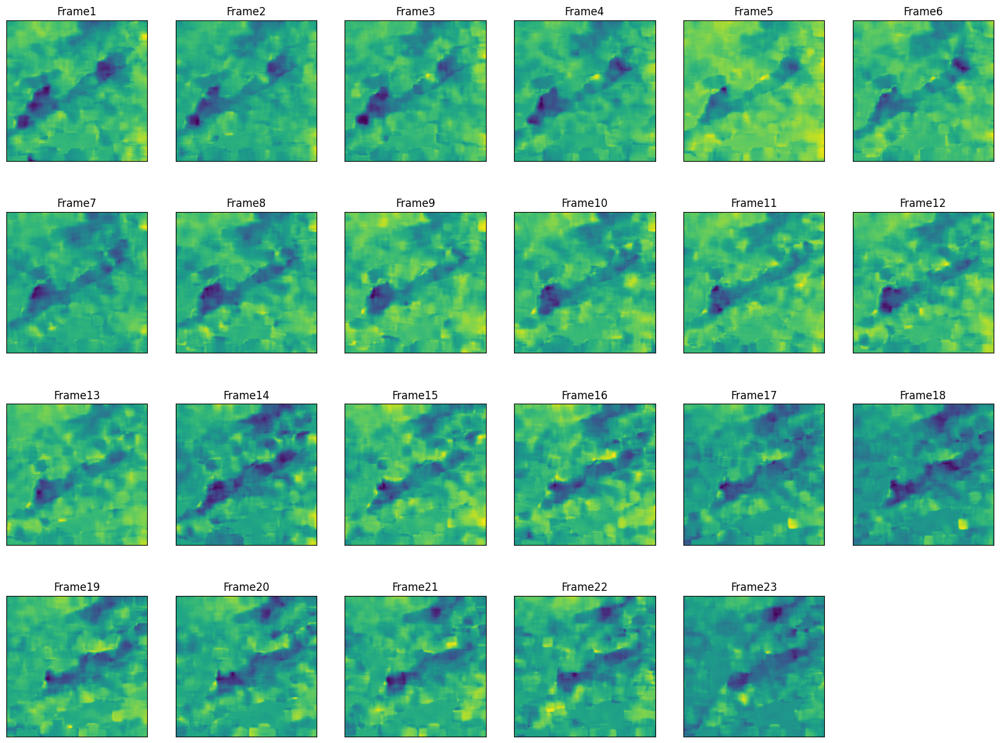

In [25]:
plt.figure(figsize=(20,15))
n=10
k=0
#plot input 
for i in range(0,23,1):
    plt.subplot(4,6,k+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(flows[i][:,:,1])
    plt.title('Frame'+str(k+1))
    k=k+1
plt.show()

#### visual check  stream lines on top of each frame of satellite images

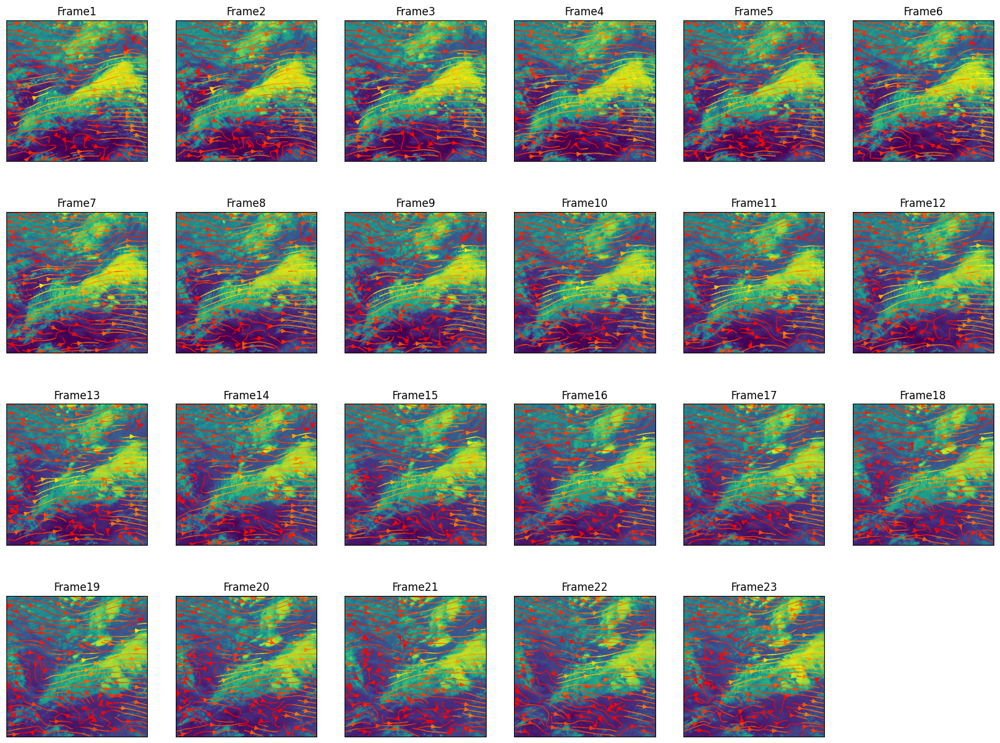

In [26]:

plt.figure(figsize=(20,15))
n=10
k=0
#plot input 
for i in range(0,23,1):
    plt.subplot(4,6,k+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    last_flow = flows[i]
    # 获取光流的 x 和 y 分量
    flow_x = last_flow[..., 0]
    flow_y = last_flow[..., 1]

    # 生成网格点
    h, w = flow_x.shape
    y, x = np.mgrid[0:h, 0:w]
    plt.streamplot(x, y, flow_x, flow_y, color=np.sqrt(flow_x**2 + flow_y**2), linewidth=1, cmap='autumn')
    
    plt.imshow(images[i])
    plt.title('Frame'+str(k+1))
    k=k+1
plt.show()

### 5. Combine lines in same direction and make it wider

In [27]:
from scipy.ndimage import gaussian_filter

In [28]:
def compute_optical_flow(images):
    flows = []
    for i in range(1, len(images)):
        prev_img = images[i-1]
        next_img = images[i]
        flow = cv2.calcOpticalFlowFarneback(prev_img, next_img, None, 0.5, 3, 15, 3, 5, 1.2, 0)
        flows.append(flow)
    return flows

In [29]:
def aggregate_flow(flow, num_bins=36, sigma=2):
    h, w = flow.shape[:2]
    fx, fy = flow[..., 0], flow[..., 1]
    magnitude, angle = cv2.cartToPolar(fx, fy, angleInDegrees=True)
    
    # 将角度分箱
    bin_edges = np.linspace(0, 360, num_bins + 1)
    bins = np.digitize(angle, bin_edges) - 1
    
    # 计算每个分箱的权重
    weights = np.zeros_like(angle)
    for bin_idx in range(num_bins):
        mask = (bins == bin_idx)
        weights[mask] = magnitude[mask]
    
    # 平滑权重
    weights = gaussian_filter(weights, sigma=sigma)
    
    return weights

In [30]:
# 计算光流
flows = compute_optical_flow(images)

# 选择最后一个光流结果用于绘制流线图
last_flow = flows[-1]

# 获取光流的 x 和 y 分量
flow_x = last_flow[..., 0]
flow_y = last_flow[..., 1]

# 生成网格点
h, w = flow_x.shape
y, x = np.mgrid[0:h, 0:w]

# 聚合光流
weights = aggregate_flow(last_flow)

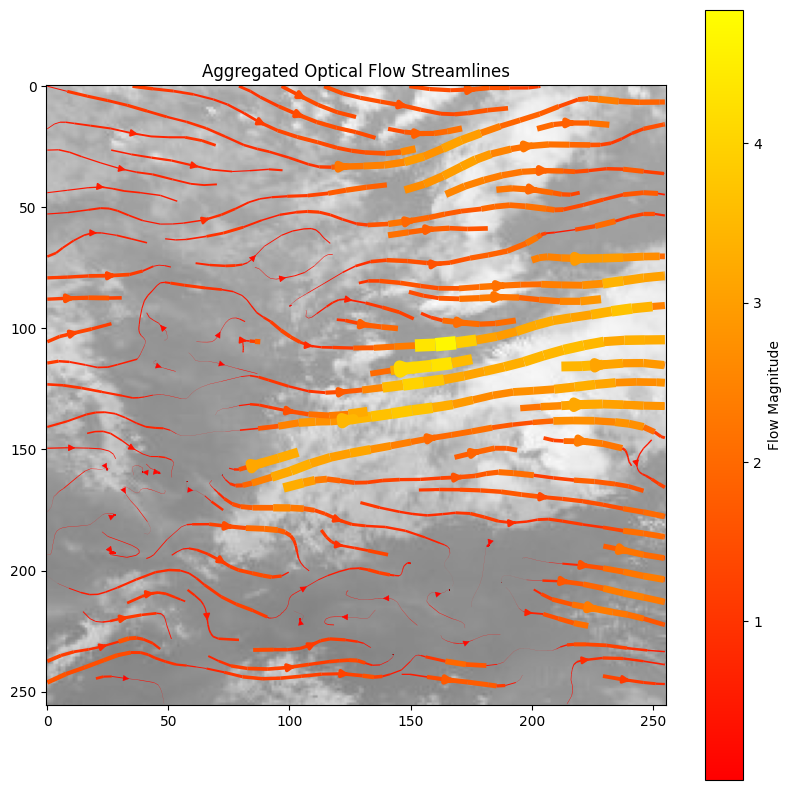

In [31]:
# 绘制流线图
plt.figure(figsize=(10, 10))
plt.imshow(images[-1], cmap='gray', alpha=0.5)
plt.streamplot(x, y, flow_x, flow_y, color=weights, linewidth=10 * weights / np.max(weights), cmap='autumn')
plt.title('Aggregated Optical Flow Streamlines')
plt.colorbar(label='Flow Magnitude')
plt.show()

### 6. Save as an animated GIF

In [32]:
from PIL import Image

In [33]:
image_path = r'D:\Tommy\++AI\himawari9\jvtest\b13'
image_files = sorted(glob.glob(image_path+'\\'+'TBB_*_4_12_5.jpg'))
image_files_1 = image_files[41:41+24]
# Open images
frames = [Image.open(image) for image in image_files_1]

In [35]:
output_path = r"D:\Tommy\++AI\himawari9\jvtest\animated_frames.gif"
frames[0].save(
    output_path, 
    save_all=True, 
    append_images=frames[1:], 
    duration=100,  # Duration for each frame in milliseconds
    loop=0  # 0 means infinite loop
)

print(f"Animated GIF saved at {output_path}")

Animated GIF saved at D:\Tommy\++AI\himawari9\jvtest\animated_frames.gif


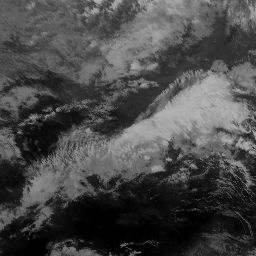